<a href="https://colab.research.google.com/github/Mike030668/MIPT_magistratura/blob/main/RL/FINAL/DZ_3/SB3_DQN_fool_env.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ОПИСАНИЕ

- Данная игра построена на моих первых опытах без картиночной игры в [Дурака](https://github.com/Mike030668/Base_Fool) на моем гитхабе.  Там можно играть с несколькими роботами или их запускать между собой.

- для данного задания решил сделать версию игры на основе основного алгоритма, но уже с картинками и там могут играть между собой:
    - роботы на правила
    - человек и робот
    - и можно человека земенить моделью рандомной.
    
- игра в Дурака на картинках расположена у меня [тут на гитхабе](https://github.com/Mike030668/Base_Fool_images)

- Правила обычного дурака с козырем.
  - Если не можешь или не хочешь, то можно взять карту нажав 0
  - выбираешь номер карты для хода, но если 2 раза не верно, то тоже пропускаешь

- Я добавил еще вывод  ревордов  за неверные шаги и прпуски

Ниже опыт адаптации и обучения моделью DQN из библиотеки `stable-baselines3`

Все ноуты по заданию соберу в папке на гитхабе - https://github.com/Mike030668/MIPT_magistratura/tree/main/RL/FINAL/DZ_3

------

На всякий случай, вначале сделал первое задание, а потом уж решился это начать, ссылка на DZ_1 - https://github.com/Mike030668/MIPT_magistratura/tree/main/RL/FINAL/DZ_1




In [ ]:
# prolect
!git clone https://github.com/Mike030668/Base_Fool_images.git -q

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import sys
dir_project = '/content/Base_Fool_images'
sys.path.append(dir_project)
from scripts.consruct_game import Durack
from scripts.elements_gane import Razdaza
from IPython.display import display, Image

# SBE and wanb

In [ ]:
!pip install stable-baselines3 wandb -q
!pip install shimmy>=0.2.1

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 182.3/182.3 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 72.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.9/953.9 kB 68.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 28.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 281.1/281.1 kB 36.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 10.6 MB/s eta 0:00:00


In [ ]:
import gym
from gym import spaces
import numpy as np
from IPython.display import Image, display, clear_output
import random
import os
import matplotlib.pyplot as plt
import imageio
import PIL
from stable_baselines3 import DQN
from stable_baselines3.common.callbacks import CheckpointCallback
from stable_baselines3.common.env_checker import check_env
import torch
import wandb
from wandb.integration.sb3 import WandbCallback

class DurakEnv(gym.Env):
    def __init__(self, show_process=False, space_size=13, img_size=(64, 64),
                 img_save_path="obs_img.png", print_out=False, make_gif=False,
                 gif_size = (920, 640)):  # Reduced image size

        self.game = Durack(cards4player=6, humans=1, robots=1,
                           img_path="Base_Fool_images/images",
                           img_save_path=img_save_path,
                           print_out=print_out,
                           plot_game=False,
                           make_gif=False)

        self.players, self.playdeck, self.trump = self.game.init_game()
        self.action_space = spaces.Discrete(space_size)  # 12 cards + 1 for pass
        self.img_size = img_size
        self.observation_space = spaces.Box(low=0, high=255, shape=(img_size[0], img_size[1], 3), dtype=np.uint8)
        self.current_player = 0
        self.done = False
        self.show_process = show_process
        self.type_action = True  # True for step, False for answer
        self.frames = []
        self.img_save_path = img_save_path
        self.state_players = self.game.game_process.make_states(self.players)
        self.model_total_reward = 0
        self.robot_total_reward = 0
        self.PRINT_OUT = print_out
        self.MAKE_GIF = make_gif
        self.gif_size = gif_size

    def reset(self):
        self.game = Durack(cards4player=6, humans=1, robots=1,
                      img_path="Base_Fool_images/images",
                      img_save_path=self.img_save_path,
                      print_out=self.PRINT_OUT,
                      plot_game=False,
                      make_gif=False)


        self.players, self.playdeck, self.trump = self.game.init_game()
        self.current_player = 0
        self.done = False
        self.type_action = True
        self.frames = []
        self.state_players = self.game.game_process.make_states(self.players)
        self.model_total_reward = 0
        self.robot_total_reward = 0

        self.game.game_process.PLAY = True
        self.game.game_process.TRUMP = self.trump
        self.game.game_process.PLAY_DECK = self.playdeck
        self.game.game_process.START_DECK.loc[self.game.game_process.TRUMP] *= 100

        return self._get_state()

    def step(self, action):
        if self.done:
            return self._get_state(), 0, self.done, {}

        reward = 0
        if self.current_player == 0:  # Human player's turn
            action_model = action
        else:
            action_model = None

        player_type = self.game.game_process.get_type(self.players[self.current_player])

        self.players[self.current_player], self.state_players[self.current_player], step_reward = self.game.game_process.action_player(
            self.players[self.current_player], self.state_players[self.current_player], self.type_action, action_model)

        if self.current_player == 0:
            reward += step_reward
            self.model_total_reward += step_reward
        else:
            self.robot_total_reward += step_reward

        self._post_step_updates()

        if self.done:
            winners = [player.name for player, state in zip(self.players, self.state_players) if state[1]]
            if 'Human' in winners[0]:
                reward += 100
                self.model_total_reward += 100
            else:
                self.robot_total_reward += 100

        return self._get_state(), reward, self.done, {"model_total_reward": self.model_total_reward, "robot_total_reward": self.robot_total_reward}

    def _post_step_updates(self):
        # Check if the game should continue
        if self.state_players[self.current_player][1]:
            self.done = True

        if self.game.game_process.GAME_FIELD.sum().sum() == 0:
            self.type_action = True
        else:
            self.type_action = False

        if (self.players[self.current_player] != 0).sum().sum() < self.game.game_process.CARDS_4PLAYER:
            razdacha_cards = Razdaza(self.game.game_process.PLAY_DECK,
                                     self.game.game_process.CARDS_4PLAYER,
                                     self.game.game_process.GAME_FIELD,
                                     self.game.game_process.BITA,
                                     self.game.game_process.START_DECK,
                                     self.PRINT_OUT)
            self.players, self.game.game_process.PLAY = razdacha_cards(self.players)

        self.current_player = (self.current_player + 1) % len(self.players)
        if self.state_players[self.current_player][1]:
            self.done = True

    def _get_state(self):
        self.game.game_process.display_game_state(
            self.players, self.game.game_process.GAME_FIELD, self.game.game_process.BITA, self.playdeck, self.trump)
        img = PIL.Image.open(self.img_save_path)

        if self.show_process:
            clear_output(True)
            plt.figure(figsize=self.game.game_process.fig_size)
            plt.imshow(img)
            plt.axis("off")
            plt.axis("tight")
            plt.axis("image")
            plt.show()

        img = img.convert("RGB")
        frame = img.resize(self.gif_size)
        frame = np.array(frame)
        img = img.resize(self.img_size)
        img = np.array(img)

        self.frames.append(frame)  # Save frame for GIF
        return img

    def save_gif(self, gif_path="game_play.gif", duration=300):
        if self.MAKE_GIF:
            imageio.mimsave(gif_path, self.frames, duration=duration)

    def _choose_card(self, card_idx):
        player_hand = self.game.game_process.show_cards(self.players[self.current_player], False)
        return player_hand[card_idx][0], player_hand[card_idx][1]

    def _is_done(self):
        return self.players[0].sum().sum() == 0 or self.players[1].sum().sum() == 0

    def _check_winner(self):
        return self.players[0].sum().sum() == 0


## First train

In [ ]:
# Training the DQN model
def main():
    wandb.init(project="durak-dqn", entity="mike-puzitskiy")  # Initialize WandB
    config = {
        "policy_type": "CnnPolicy",
        "total_timesteps": 500,
        "env_name": "DurakEnv"
    }
    wandb.config.update(config)

    env = DurakEnv(show_process=False, make_gif=False)

    # Check if CUDA is available
    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    dir_save = "/content/drive/Othercomputers/My_comp/Документы/МФТИ_Наука_о_данных/RL_course/DZ_Final/DZ_3"

    # Set up the DQN model
    model = DQN('CnnPolicy', env, verbose=1, tensorboard_log=  dir_save +"/durak_dqn_tensorboard/",
                device=device, buffer_size=5000, batch_size=16)  # Set buffer size and batch size

    # Set up a callback for saving the model at certain intervals
    checkpoint_callback = CheckpointCallback(save_freq=1000, save_path= dir_save +'/models/', name_prefix='durak_dqn')

    # Train the model with WandB callback
    model.learn(total_timesteps=1000, callback=[checkpoint_callback,
                                                 WandbCallback(gradient_save_freq=100,
                                                               model_save_path= dir_save +"/models", verbose=2)])

    # Save the final model
    model.save(dir_save + "/durak_dqn_final")

    # Evaluate the model
    obs = env.reset()
    done = False
    model_total_reward = 0
    robot_total_reward = 0

    while not done:
        action, _ = model.predict(obs, deterministic=True)
        obs, reward, done, info = env.step(action)
        model_total_reward = info["model_total_reward"]
        robot_total_reward = info["robot_total_reward"]

    print(f'Total Reward: {model_total_reward}, Robot Total Reward: {robot_total_reward}')

    wandb.log({
        "model_total_reward": model_total_reward,
        "robot_total_reward": robot_total_reward
    })  # Log final rewards to WandB

    #env.save_gif("game_play.gif", duration=500)
    #display(Image(filename="game_play.gif"))

if __name__ == "__main__":
    main()


The number of humans is already set - 1
The number of robots is already set - 1
Trump suit is clubsUsing cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Wrapping the env in a VecTransposeImage.


/usr/local/lib/python3.10/dist-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(


The number of humans is already set - 1
The number of robots is already set - 1
Trump suit is diamondsLogging to /content/drive/Othercomputers/My_comp/Документы/МФТИ_Наука_о_данных/RL_course/DZ_Final/DZ_3/durak_dqn_tensorboard/DQN_2
Robot_1(rand) made a move diamonds_ace
Player Robot_1(rand) finished the game
The number of humans is already set - 1
The number of robots is already set - 1
Robot_1(min) made a move clubs_ace
Player Robot_1(min) finished the game
The number of humans is already set - 1
The number of robots is already set - 1
Robot_1(rand) made a move hearts_jack
Player Robot_1(rand) finished the game
The number of humans is already set - 1
The number of robots is already set - 1
Robot_1(rand) made a move spades_ace
Player Robot_1(rand) finished the game
The number of humans is already set - 1
The number of robots is already set - 1
Trump suit is clubs----------------------------------
| rollout/            |          |
|    ep_len_mean      | 59       |
|    ep_rew_mean   

The number of participants (robots and humans) should be in total not less than 2 and not more than 6
The number of humans is already set - 1
The number of robots is already set - 1

['Human_1', 'Robot_1(rand)']
rand - robot with random choice of possible cards for the move
min - robot chooses the minimum possible card for the move 

Dealing cards:
Dealing cards to Human_1
Dealing cards to Robot_1(rand)

Trump suit is hearts

The number of participants (robots and humans) should be in total not less than 2 and not more than 6
The number of humans is already set - 1
The number of robots is already set - 1

['Human_1', 'Robot_1(min)']
rand - robot with random choice of possible cards for the move
min - robot chooses the minimum possible card for the move 

Dealing cards:
Dealing cards to Human_1
Dealing cards to Robot_1(min)

Trump suit is spades

Your move, Human_1
Used human model 
Player Human_1 skipped the move
Robot_1(min) made a move hearts_6
Dealing cards to Robot_1(min)

On the f

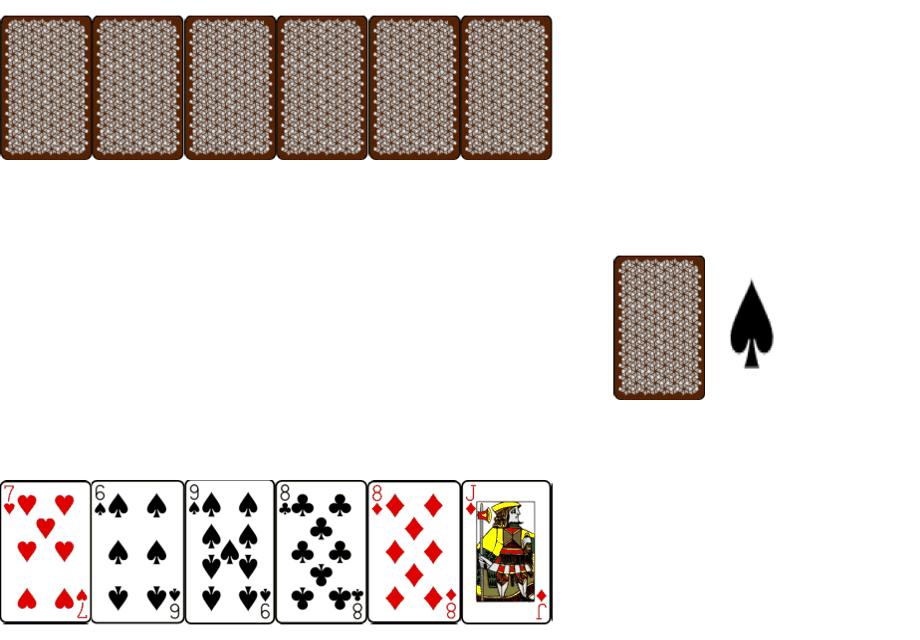

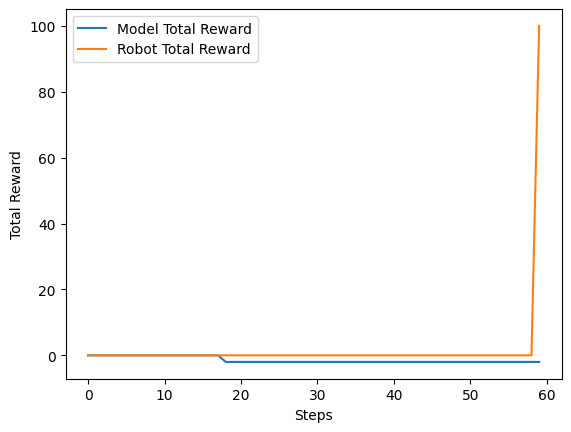

In [ ]:
dir_save = "/content/drive/Othercomputers/My_comp/Документы/МФТИ_Наука_о_данных/RL_course/DZ_Final/DZ_3"

# Load the trained model
model = DQN.load(dir_save + "/durak_dqn_final")

# Create the environment
env = DurakEnv(show_process=False, make_gif=True, print_out=True)

# Reset the environment
obs = env.reset()

done = False
total_reward = 0
robot_total_reward = 0

rewards_model = []
rewards_robot = []

# Run inference using the loaded model
while not done:
    # Get the model's action
    action, _states = model.predict(obs)

    # Take a step in the environment
    obs, reward, done, info = env.step(action)
    total_reward += reward
    rewards_model.append(info["model_total_reward"])
    rewards_robot.append(info["robot_total_reward"])

# Save and display the game as a GIF
env.save_gif("game_play.gif", duration=500)
display(Image(filename="game_play.gif"))

# Plot the rewards
plt.plot(rewards_model, label="Model Total Reward")
plt.plot(rewards_robot, label="Robot Total Reward")
plt.xlabel("Steps")
plt.ylabel("Total Reward")
plt.legend()
plt.show()


## Первые выводы

В конечной игре модель уже показал итоговое вознаграждениее 0.

 И это уже достижение, так как начинала они с - 26.

То есть модель научилась делать правильные ходы, а выиграть сложнее, и только тогда будет не 0, а 100.

Главное, что построена и игра, в которой могут играть и люди и роботы, и построено обучение модели, играющей за человекаю
**И итог небольшого обучения показывает обучаемость уже !!!!**

## Next train

Изучив подробнее инференсе, я в итоге плнял, что модель просто стала пропускать ходы, так как за это не шрафовал я.

Я добавил штраф и за пропуск хода и за не возможность сходить. В итоге у робота тоже будет и минус в реворде на шагах пропуска, он хоть ходит и по правилам, но может попасть тоже в пат.

Я заодно решил и понять повторное обучение, поэтому загрузил пусть плохо, но обученную модель.

In [ ]:
import gym
from stable_baselines3 import DQN
from stable_baselines3.common.evaluation import evaluate_policy
from stable_baselines3.common.env_util import make_vec_env
import matplotlib.pyplot as plt
from IPython.display import Image, display

dir_save = "/content/drive/Othercomputers/My_comp/Документы/МФТИ_Наука_о_данных/RL_course/DZ_Final/DZ_3"

# Create and wrap the environment
env = make_vec_env(lambda: DurakEnv(show_process=False, make_gif=False, print_out=False), n_envs=1)

# Load the existing model
model = DQN.load(dir_save + "/durak_dqn_final")

# Set up a callback for saving the model at certain intervals
checkpoint_callback = CheckpointCallback(save_freq=1000, save_path= dir_save +'/models/', name_prefix='durak_dqn')

# Set the environment
model.set_env(env)

# Continue training the model
model.learn(total_timesteps=5000)

# Save the updated model
model.save(dir_save + "/durak_dqn_final")

# Evaluate the model
mean_reward, std_reward = evaluate_policy(model, env, n_eval_episodes=10)
print(f"Mean reward: {mean_reward} +/- {std_reward}")

# Run inference to visualize the performance
env = DurakEnv(show_process=False, make_gif=False, print_out=True)
obs = env.reset()

done = False
total_reward = 0

rewards_model = []
rewards_robot = []

while not done:
    action, _states = model.predict(obs)
    obs, reward, done, info = env.step(action)
    total_reward += reward
    rewards_model.append(info["model_total_reward"])
    rewards_robot.append(info["robot_total_reward"])

env.save_gif("game_play.gif", duration=500)
display(Image(filename="game_play.gif"))

plt.plot(rewards_model, label="Model Total Reward")
plt.plot(rewards_robot, label="Robot Total Reward")
plt.xlabel("Steps")
plt.ylabel("Total Reward")
plt.legend()
plt.show()


The number of humans is already set - 1
The number of robots is already set - 1
Trump suit is heartsWrapping the env in a VecTransposeImage.
The number of humans is already set - 1
The number of robots is already set - 1
Trump suit is spades

/usr/local/lib/python3.10/dist-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/gym/core.py:256: DeprecationWarning: WARN: Function `env.seed(seed)` is marked as deprecated and will be removed in the future. Please use `env.reset(seed=seed)` instead.
  deprecation(


Logging to /content/drive/Othercomputers/My_comp/Документы/МФТИ_Наука_о_данных/RL_course/DZ_Final/DZ_3/durak_dqn_tensorboard/DQN_3
Robot_1(rand) made a move spades_ace
Player Robot_1(rand) finished the game
The number of humans is already set - 1
The number of robots is already set - 1
Robot_1(min) made a move clubs_king
Player Robot_1(min) finished the game
The number of humans is already set - 1
The number of robots is already set - 1
Robot_1(min) made a move spades_ace
Player Robot_1(min) finished the game
The number of humans is already set - 1
The number of robots is already set - 1
Robot_1(min) made a move hearts_ace
Player Robot_1(min) finished the game
The number of humans is already set - 1
The number of robots is already set - 1
Trump suit is clubs----------------------------------
| rollout/            |          |
|    ep_len_mean      | 57.5     |
|    ep_rew_mean      | -41.5    |
|    exploration_rate | 0.781    |
| time/               |          |
|    episodes         

## train after problem OZU

In [ ]:
import gym
from stable_baselines3 import DQN
from stable_baselines3.common.evaluation import evaluate_policy
from stable_baselines3.common.env_util import make_vec_env
import matplotlib.pyplot as plt
from IPython.display import Image, display
import torch

# Check if CUDA is available
device = 'cuda' if torch.cuda.is_available() else 'cpu'

dir_save = "/content/drive/Othercomputers/My_comp/Документы/МФТИ_Наука_о_данных/RL_course/DZ_Final/DZ_3"

# Create and wrap the environment
env = make_vec_env(lambda: DurakEnv(show_process=False, make_gif=False, print_out=False), n_envs=1)

# Set up the DQN model
model = DQN('CnnPolicy', env, verbose=1, tensorboard_log=  dir_save +"/durak_dqn_tensorboard/",
            device=device, buffer_size=3000, batch_size=8)  # Set buffer size and batch size

# Load the existing model
model = DQN.load(dir_save + "/durak_dqn_final")

# Set up a callback for saving the model at certain intervals
checkpoint_callback = CheckpointCallback(save_freq=100, save_path= dir_save +'/models/', name_prefix='durak_dqn')

# Set the environment
model.set_env(env)

# Continue training the model
model.learn(total_timesteps=10000)

# Save the updated model
model.save(dir_save + "/durak_dqn_final")

# Evaluate the model
mean_reward, std_reward = evaluate_policy(model, env, n_eval_episodes=10)
print(f"Mean reward: {mean_reward} +/- {std_reward}")

# Run inference to visualize the performance
env = DurakEnv(show_process=False, make_gif=False, print_out=True)
obs = env.reset()

done = False
total_reward = 0

rewards_model = []
rewards_robot = []

while not done:
    action, _states = model.predict(obs)
    obs, reward, done, info = env.step(action)
    total_reward += reward
    rewards_model.append(info["model_total_reward"])
    rewards_robot.append(info["robot_total_reward"])

env.save_gif("game_play.gif", duration=500)
display(Image(filename="game_play.gif"))

plt.plot(rewards_model, label="Model Total Reward")
plt.plot(rewards_robot, label="Robot Total Reward")
plt.xlabel("Steps")
plt.ylabel("Total Reward")
plt.legend()
plt.show()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/gym/core.py:256: DeprecationWarning: WARN: Function `env.seed(seed)` is marked as deprecated and will be removed in the future. Please use `env.reset(seed=seed)` instead.
  deprecation(


The number of humans is already set - 1
The number of robots is already set - 1
Trump suit is diamondsWrapping the env in a VecTransposeImage.
The number of humans is already set - 1
The number of robots is already set - 1
Trump suit is diamondsLogging to /content/drive/Othercomputers/My_comp/Документы/МФТИ_Наука_о_данных/RL_course/DZ_Final/DZ_3/durak_dqn_tensorboard/DQN_5
Robot_1(min) made a move diamonds_king
Player Robot_1(min) finished the game
The number of humans is already set - 1
The number of robots is already set - 1
Robot_1(rand) made a move diamonds_ace
Player Robot_1(rand) finished the game
The number of humans is already set - 1
The number of robots is already set - 1
Robot_1(rand) made a move spades_ace
Player Robot_1(rand) finished the game
The number of humans is already set - 1
The number of robots is already set - 1
Robot_1(rand) made a move spades_king
Player Robot_1(rand) finished the game
The number of humans is already set - 1
The number of robots is already set 

# Выводы

- К сожалению, не успел оптимизировать параметры и пока вылетает по ОЗУ при обучение и не всегла успевает сохраниться. Но видно уже модель из среднего отризательного стала положительногй, то есть хоть раз даже и выиграла!!!!

- Построена игра, в которой могут играть и людиб и роботы, и построено обучение модели, которая учится играя за человека.

**И итог небольшого обучения показывает обучаемость модели уже, так как ее усредненный лосс падает !!!!**